# Bankruptacy Prediction 
### Contents
#### 1. Exploratory Data Analysis
#### 2. Visualizations
#### 3. Dimensionality Reduction using t-SNE for visualization
#### 4. Feature Engineering
#### 5. Resampling
#### 6. Model Building

### Exploratory Data Analysis

In [20]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
data = pd.read_csv('.//data.csv')

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [4]:
data.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


In [6]:
# Find the NaN values if any
for col in data.columns:
    na_count = sum(data[col].isna())
    print(f"Na Values for {col}: {na_count}")

#print(data.columns)

Na Values for Bankrupt?: 0
Na Values for  ROA(C) before interest and depreciation before interest: 0
Na Values for  ROA(A) before interest and % after tax: 0
Na Values for  ROA(B) before interest and depreciation after tax: 0
Na Values for  Operating Gross Margin: 0
Na Values for  Realized Sales Gross Margin: 0
Na Values for  Operating Profit Rate: 0
Na Values for  Pre-tax net Interest Rate: 0
Na Values for  After-tax net Interest Rate: 0
Na Values for  Non-industry income and expenditure/revenue: 0
Na Values for  Continuous interest rate (after tax): 0
Na Values for  Operating Expense Rate: 0
Na Values for  Research and development expense rate: 0
Na Values for  Cash flow rate: 0
Na Values for  Interest-bearing debt interest rate: 0
Na Values for  Tax rate (A): 0
Na Values for  Net Value Per Share (B): 0
Na Values for  Net Value Per Share (A): 0
Na Values for  Net Value Per Share (C): 0
Na Values for  Persistent EPS in the Last Four Seasons: 0
Na Values for  Cash Flow Per Share: 0
Na 

In [7]:
print(data.shape)

(6819, 96)


In [8]:
print(len(data.loc[data['Bankrupt?'] == 0]))
print(len(data.loc[data['Bankrupt?'] == 1]))

6599
220


### Visualizations

In [9]:
data.corr()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
Bankrupt?,1.000000,-0.260807,-0.282941,-0.273051,-0.100043,-0.099445,-0.000230,-0.008517,-0.008857,-0.016593,...,-0.315457,0.035104,-0.005547,-0.100044,-0.180987,0.166812,0.010508,-0.005509,NaN,-0.083048
ROA(C) before interest and depreciation before interest,-0.260807,1.000000,0.940124,0.986849,0.334719,0.332755,0.035725,0.053419,0.049222,0.020501,...,0.887670,-0.071725,0.008135,0.334721,0.274287,-0.143629,-0.016575,0.010573,NaN,0.052416
ROA(A) before interest and % after tax,-0.282941,0.940124,1.000000,0.955741,0.326969,0.324956,0.032053,0.053518,0.049474,0.029649,...,0.961552,-0.098900,0.011463,0.326971,0.291744,-0.141039,-0.011515,0.013372,NaN,0.057887
ROA(B) before interest and depreciation after tax,-0.273051,0.986849,0.955741,1.000000,0.333749,0.331755,0.035212,0.053726,0.049952,0.022366,...,0.912040,-0.089088,0.007523,0.333750,0.280617,-0.142838,-0.014663,0.011473,NaN,0.056430
Operating Gross Margin,-0.100043,0.334719,0.326969,0.333749,1.000000,0.999518,0.005745,0.032493,0.027175,0.051438,...,0.300143,0.022672,0.004205,1.000000,0.075304,-0.085434,-0.011806,-0.001167,NaN,0.120029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Liability to Equity,0.166812,-0.143629,-0.141039,-0.142838,-0.085434,-0.085407,0.001541,-0.004043,-0.004390,-0.011899,...,-0.159697,0.021982,-0.003724,-0.085434,-0.791836,1.000000,0.002119,0.001487,NaN,-0.159654
Degree of Financial Leverage (DFL),0.010508,-0.016575,-0.011515,-0.014663,-0.011806,-0.011268,0.000935,0.000855,0.000927,-0.000556,...,-0.010463,-0.001881,-0.008812,-0.011806,-0.000093,0.002119,1.000000,0.016513,NaN,-0.016739
Interest Coverage Ratio (Interest expense to EBIT),-0.005509,0.010573,0.013372,0.011473,-0.001167,-0.001158,0.000393,0.000984,0.000957,0.001024,...,0.012746,0.000239,0.001027,-0.001169,0.005147,0.001487,0.016513,1.000000,NaN,-0.008339
Net Income Flag,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


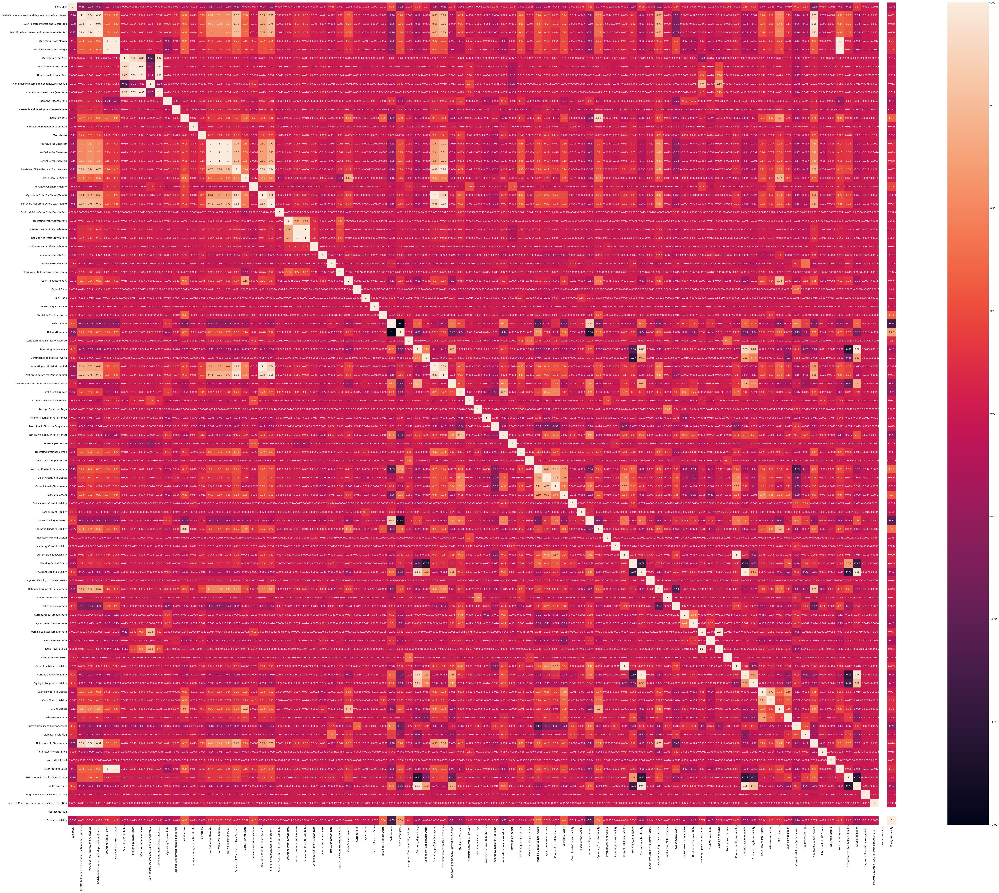

In [12]:
plt.figure(figsize=(80,64))
sns.heatmap(data.corr(), annot=True)
plt.show()

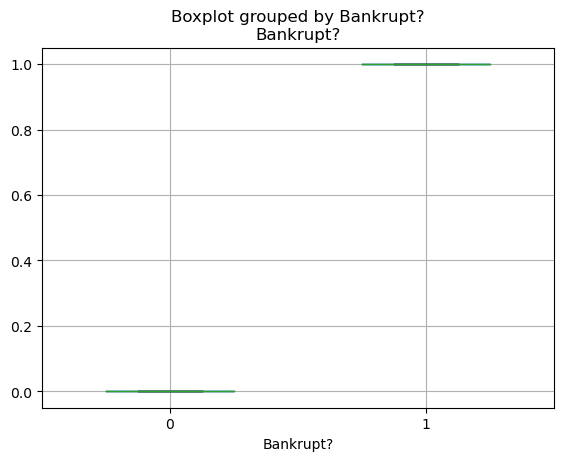

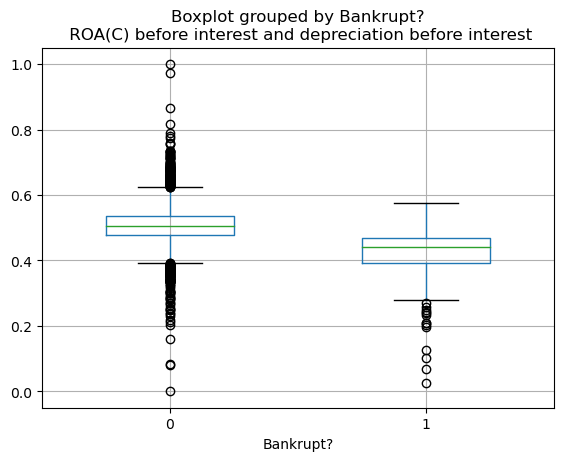

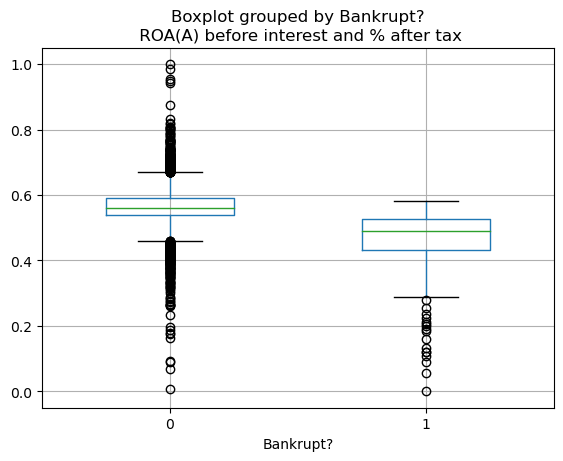

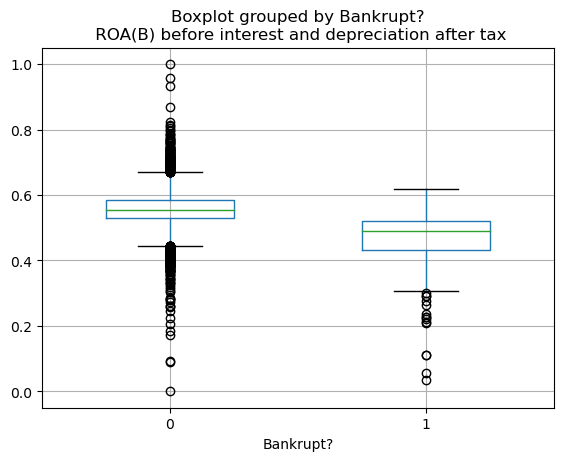

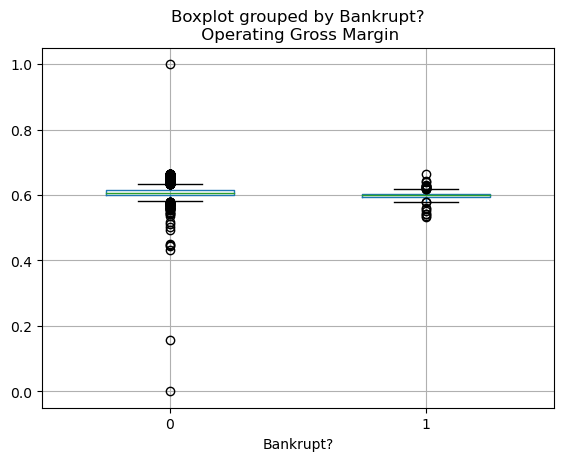

...

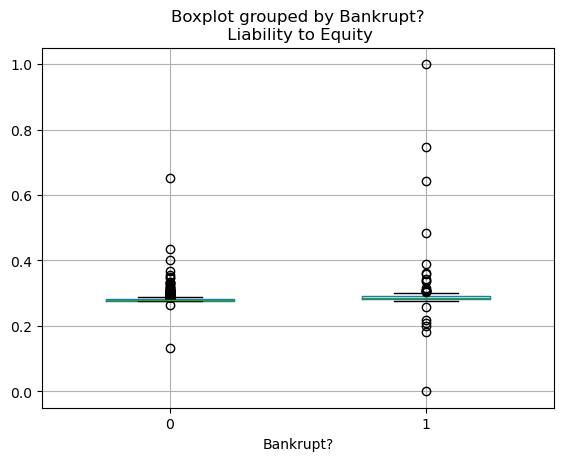

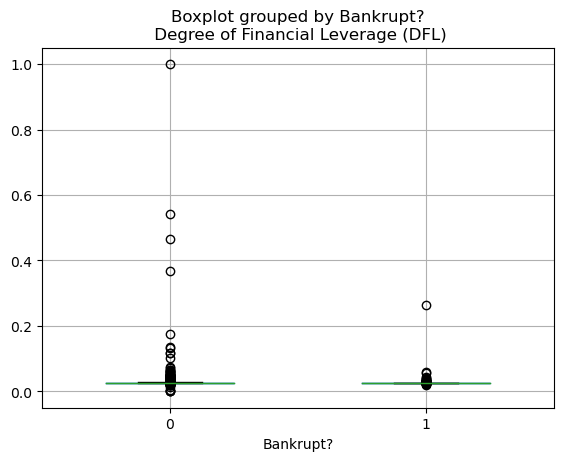

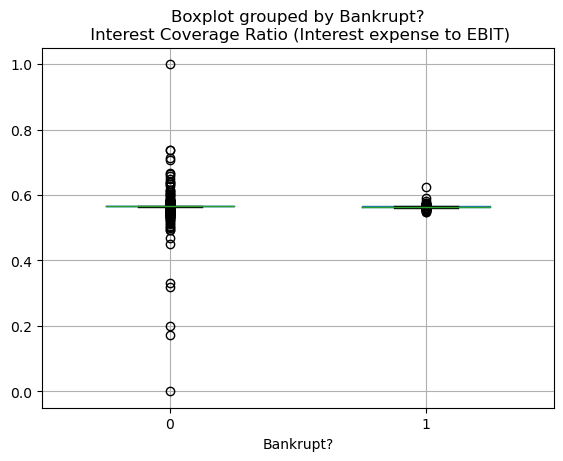

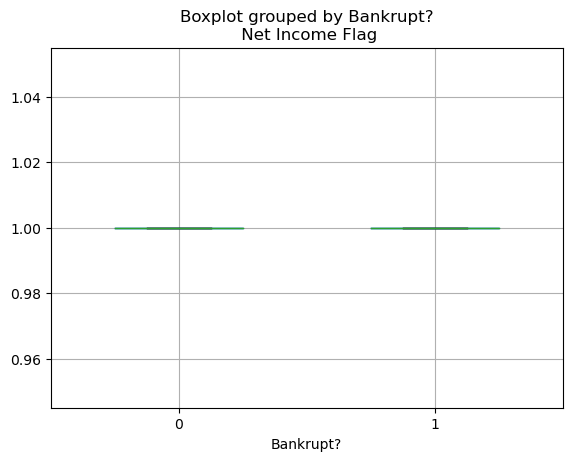

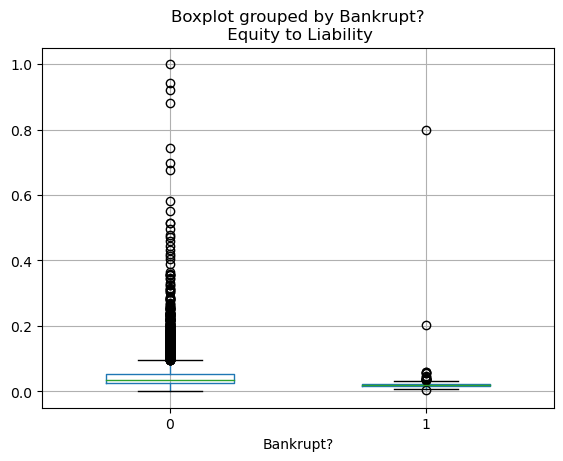

In [17]:
# Boxplots
for i in range(len(data.columns)):
  data.boxplot(column=data.columns[i], by='Bankrupt?', widths=0.5)

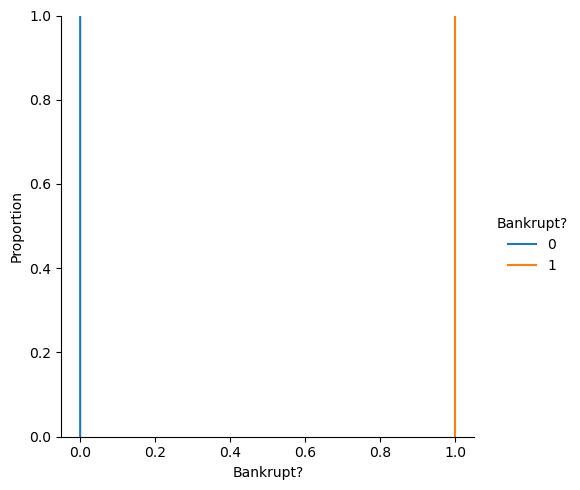

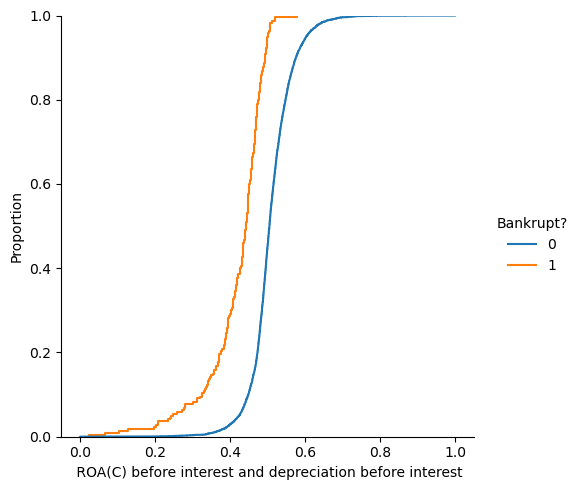

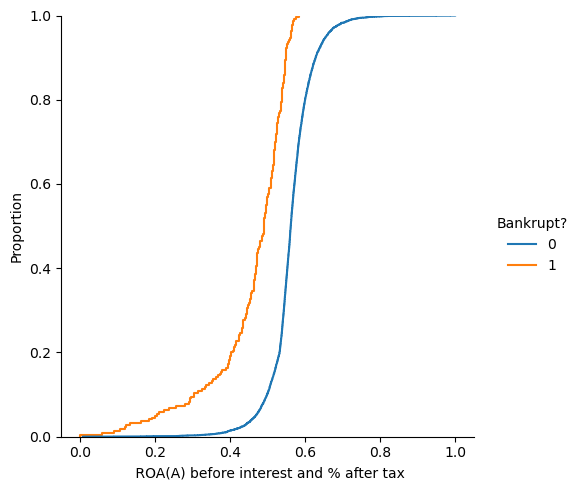

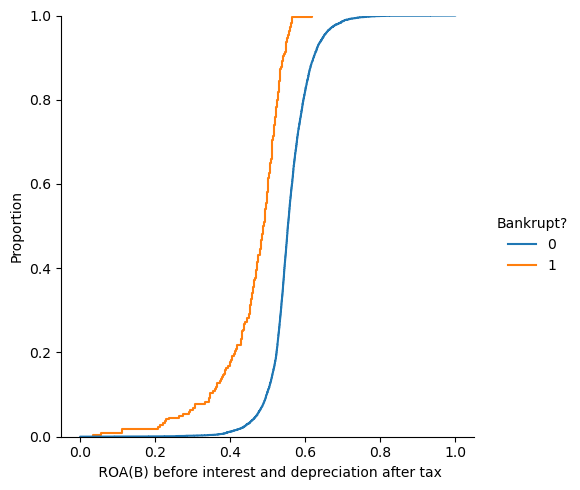

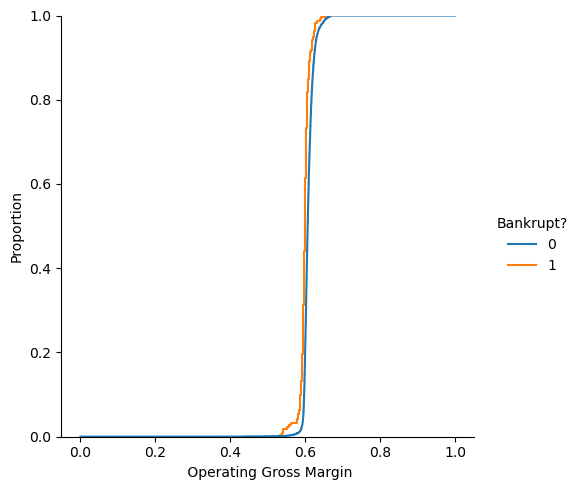

...

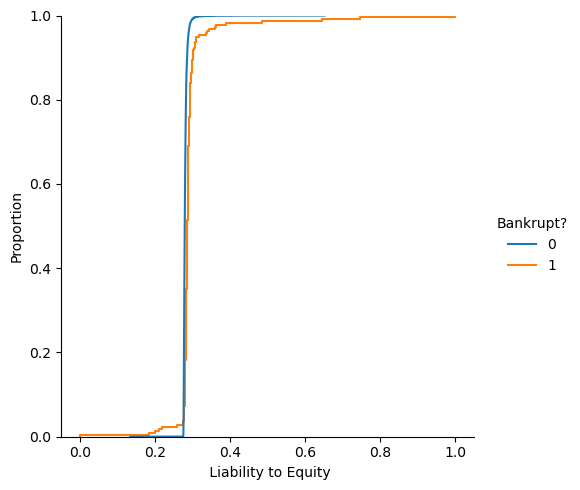

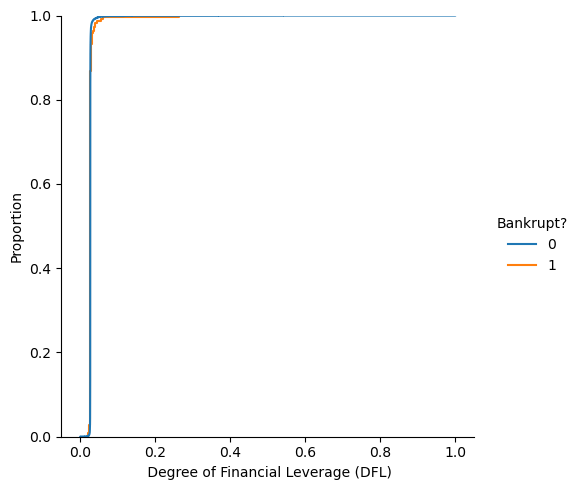

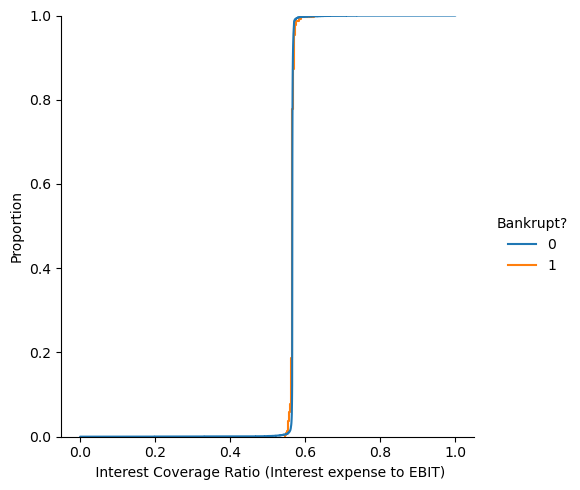

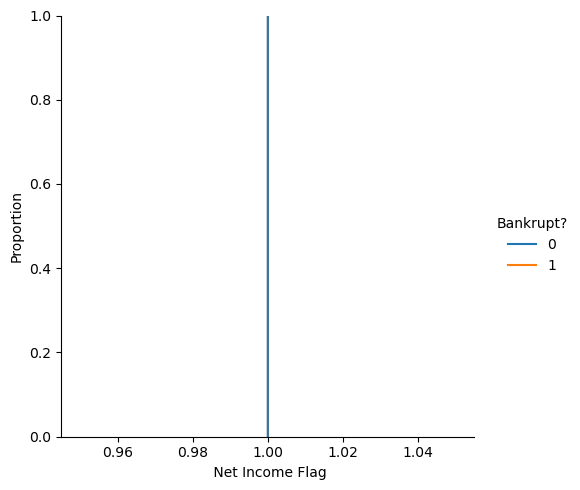

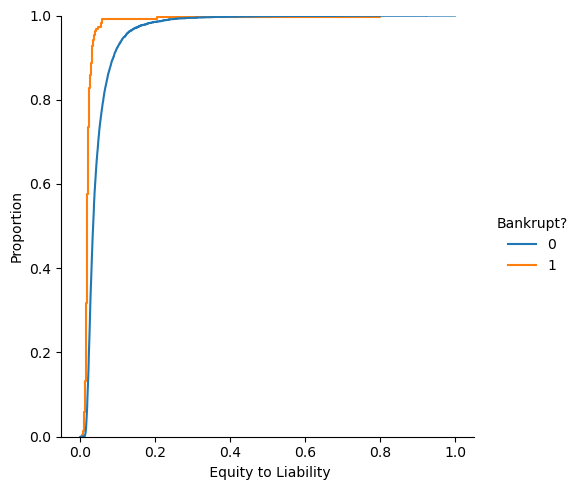

In [19]:
# Empirical Commutative Distribution plots(ecdf plots)
for i in range(len(data.columns)):
    sns.displot(data=data, x=data.columns[i], hue='Bankrupt?', kind='ecdf')

In [1]:
# Read data frame into df

df = pd.read_csv('.//data.csv')
df

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009


In [2]:
df['Bankrupt?'].value_counts()

0    6599
1     220
Name: Bankrupt?, dtype: int64

In [3]:
y = df['Bankrupt?']
X = df.drop(columns=['Bankrupt?'])

In [4]:
len(y)

6819

In [5]:
y.value_counts()

0    6599
1     220
Name: Bankrupt?, dtype: int64

## Reduction of dimensions for visualisation of data using t-SNE

In [6]:
# t-SNE method for dimensionality reduction
from sklearn.manifold import TSNE 
import seaborn as sns
import matplotlib.pyplot as plt
# Split-out validation dataset
array = df.values
# separate array into input and output components
X1 = array[:,1:]
Y = array[:,0]

In [7]:
# 2-D Visualization
df_tsne = TSNE(n_components=2).fit_transform(X1)

In [8]:
tsne_df = pd.DataFrame(df_tsne, columns=["x1","x2"])
tsne_df["Bankrupt?"]=df["Bankrupt?"]
tsne_df

,x1,x2,Bankrupt?
0,38.961399,39.453007,1
1,14.709932,65.496704,1
2,-39.255604,-21.184771,1
3,57.218693,29.110382,1
4,64.972229,-18.683039,1
...,...,...,...
6814,-69.677551,-19.297903,0
6815,-6.408253,20.736185,0
6816,-30.407269,-31.728062,0
6817,-34.510132,53.499710,0


<Axes: xlabel='x1', ylabel='x2'>

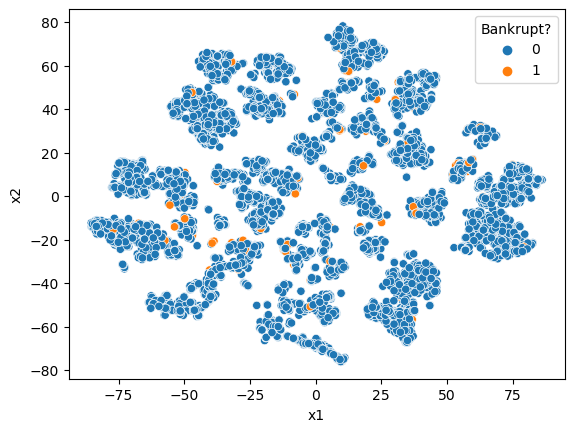

In [9]:
sns.scatterplot(data=tsne_df,x='x1',y='x2',hue='Bankrupt?',legend="full",alpha=1)

In [10]:
# 3-D Visualization
df_tsne1 = TSNE(n_components=3).fit_transform(X1)

In [11]:
tsne_df1 = pd.DataFrame(df_tsne1, columns=["x1","x2","x3"])
tsne_df1["Bankrupt?"]=df["Bankrupt?"]
tsne_df1

,x1,x2,x3,Bankrupt?
0,13.992654,10.275784,8.232190,1
1,1.731041,17.594694,1.570170,1
2,-7.699023,-10.575851,-5.924163,1
3,16.798569,11.591412,-12.973143,1
4,21.376963,-5.430100,3.561869,1
...,...,...,...,...
6814,-19.710506,-11.098464,-6.004987,0
6815,0.517834,4.842640,6.942313,0
6816,-5.770007,-14.366280,-2.234333,0
6817,-14.440604,7.118478,7.856028,0


C:\Users\shiva\AppData\Local\Temp\ipykernel_18368\692419328.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax.scatter(x, y, z, s=20, c=col, marker='o', cmap=cmap, alpha=1)
C:\Users\shiva\anaconda3\Lib\site-packages\matplotlib\collections.py:1080: UserWarning: Collection without array used. Make sure to specify the values to be colormapped via the `c` argument.
  warnings.warn("Collection without array used. Make sure to "


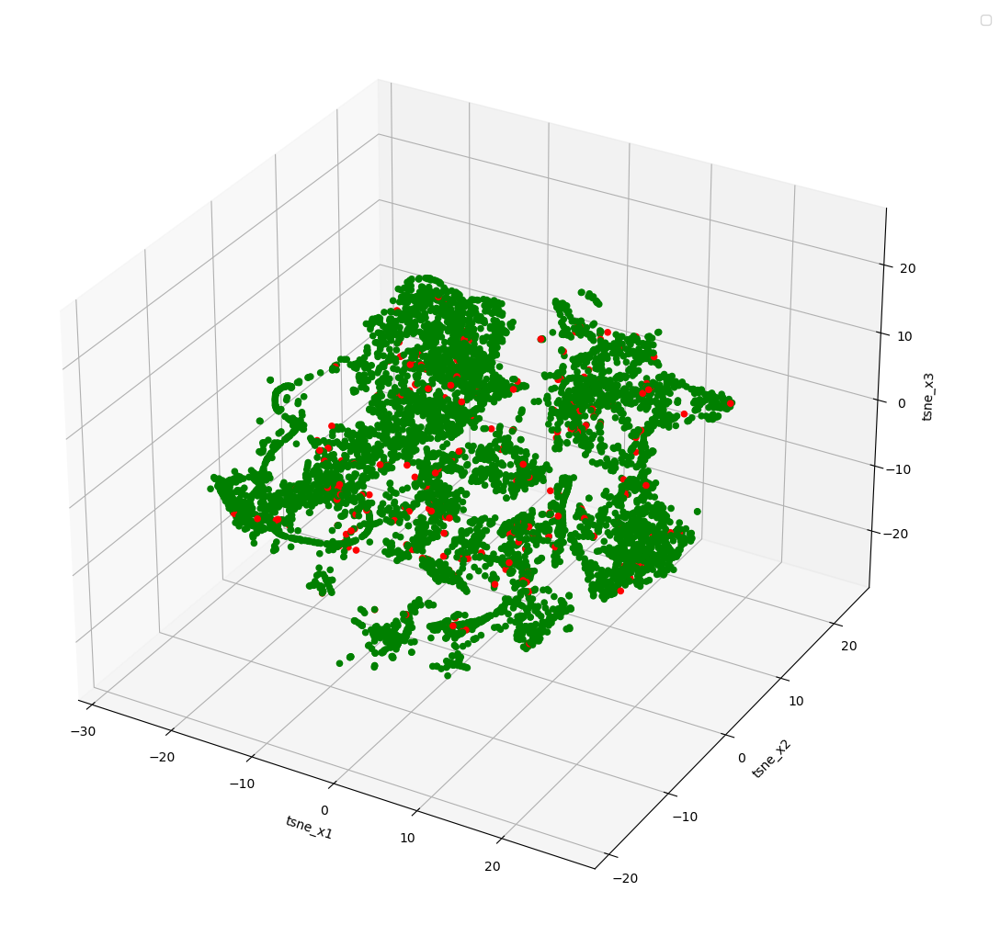

In [12]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap

# axes instance
fig = plt.figure(figsize=(10,12))
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)

# get colormap from seaborn
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())

x = tsne_df1['x1']
y = tsne_df1['x2']
z = tsne_df1['x3']

ax.set_xlabel("tsne_x1")
ax.set_ylabel("tsne_x2")
ax.set_zlabel("tsne_x3")
# plot
col=tsne_df1["Bankrupt?"].map({1:'r',0:'g'})
sc = ax.scatter(x, y, z, s=20, c=col, marker='o', cmap=cmap, alpha=1)

# legend
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()
# save
# plt.savefig("scatter_hue", bbox_inches='tight')

### Conclusions from the results of t-SNE
#### It appears that the bankrupt = 1 data points are inter-twined in between the bankrupt = 0 data points. Hence there seems to be no anomolies in the datapoints considering all the feature space. Therefore we cannot apply unsupervised anomoly detection algorithms like isolation forest. We can apply supervised non-linear methods like SVM, Random Forest, XGBOOST and Artificial Neural Networks for classification.

In [13]:
X

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,0.780284,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,0.781241,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,0.781550,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,0.781588,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,0.781586,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,0.781546,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,0.781663,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009


In [19]:
Y

array([1., 1., 1., ..., 0., 0., 0.])

## Feature Extraction using mutual_info_classif

In [9]:
from sklearn.feature_selection import mutual_info_classif

feature_names = X.columns
mi = mutual_info_classif(X, Y)

feature_scores = dict(zip(feature_names, mi))
sorted_features = sorted(feature_scores.items(), key=lambda x: x[1], reverse=True)

# Print the sorted features with attribute name and score as key-value pairs
for feature, score in sorted_features:
    print(f"{feature}: {score}")

 Persistent EPS in the Last Four Seasons: 0.04239522871788326
 Net Income to Stockholder's Equity: 0.040482799213047205
 Net profit before tax/Paid-in capital: 0.04009113624570193
 Borrowing dependency: 0.03937631359616911
 Per Share Net profit before tax (Yuan ¥): 0.03816070924545212
 ROA(A) before interest and % after tax: 0.036775439053086334
 Net Income to Total Assets: 0.036738039726433414
 Net worth/Assets: 0.035375269491416006
 Debt ratio %: 0.035182250408353655
 Interest Expense Ratio: 0.034976362664621785
 Continuous interest rate (after tax): 0.03424884402480943
 Equity to Liability: 0.03402685304927355
 Interest Coverage Ratio (Interest expense to EBIT): 0.03348709297742136
 Liability to Equity: 0.03333054543621827
 Retained Earnings to Total Assets: 0.032959651873756934
 Degree of Financial Leverage (DFL): 0.03295416314672828
 Net Value Per Share (A): 0.03172470985625586
 Net Value Per Share (B): 0.03155315438977779
 Total income/Total expense: 0.030780346169192674
 ROA(C) 

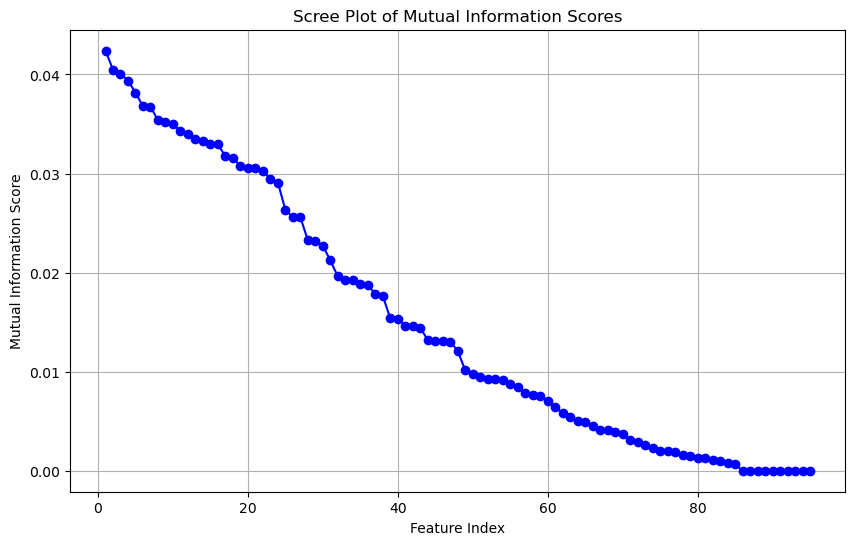

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have calculated mutual information scores and stored them in the 'mi' array

# Sort the mutual information scores in descending order
sorted_mi = np.sort(mi)[::-1]

# Create an array of the feature indices to use as x-axis values
feature_indices = np.arange(1, len(sorted_mi) + 1)

# Create the scree plot
plt.figure(figsize=(10, 6))
plt.plot(feature_indices, sorted_mi, marker='o', linestyle='-', color='b')
plt.title('Scree Plot of Mutual Information Scores')
plt.xlabel('Feature Index')
plt.ylabel('Mutual Information Score')
plt.grid(True)

plt.show()

In [11]:
# Select important features

threshold = 0.005
selected_features = [feature for feature, score in feature_scores.items() if score > threshold]
print(len(selected_features))

64


In [12]:
X_new = df[selected_features]
y = df['Bankrupt?']

In [13]:
y

0       1
1       1
2       1
3       1
4       1
       ..
6814    0
6815    0
6816    0
6817    0
6818    0
Name: Bankrupt?, Length: 6819, dtype: int64

In [14]:
X_new

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),...,Cash Flow to Equity,Current Liability to Current Assets,Net Income to Total Assets,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,...,0.312905,0.118250,0.716845,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,...,0.314163,0.047775,0.795297,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,0.020794
2,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,0.780284,...,0.314515,0.025346,0.774670,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,0.016474
3,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,0.781241,...,0.302382,0.067250,0.739555,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,0.023982
4,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,0.781550,...,0.311567,0.047725,0.795016,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,0.035490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,0.781588,...,0.314063,0.027951,0.799927,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,0.029890
6815,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,0.781586,...,0.314446,0.031470,0.799748,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,0.038284
6816,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,0.781546,...,0.313353,0.007542,0.797778,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,0.097649
6817,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,0.781663,...,0.320118,0.022916,0.811808,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,0.044009


### Balancing the classes with smote() oversampling

In [15]:
from imblearn.over_sampling import SMOTE 
oversample = SMOTE()
X,y=oversample.fit_resample(X_new,y)

In [16]:
y.value_counts()

1    6599
0    6599
Name: Bankrupt?, dtype: int64

## Model Building

### Classification using Random Forest Classifier

In [38]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
df_new_modified=scaler.fit_transform(X)

In [71]:
# Grid Search CV using RandomForest Classifier

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_predict, KFold

# Defining parameter grid
n_estimators = [100,250,400]
max_depth = [4,6,8]
min_samples_split = [50,100,150]
min_samples_leaf = [30, 40,50]
  
param_dict = {'n_estimators' : n_estimators,
                'max_depth' : max_depth,
                'min_samples_split' : min_samples_split,
                'min_samples_leaf' : min_samples_leaf}
rf_model = RandomForestClassifier(class_weight='balanced')
rf_grid = GridSearchCV(estimator=rf_model,
                        param_grid = param_dict,
                        cv = 10, verbose=2, scoring='roc_auc')
rf_grid.fit(X,y)
model = rf_grid.best_estimator_

Fitting 10 folds for each of 81 candidates, totalling 810 fits
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=50, n_estimators=100; total time=   3.5s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=50, n_estimators=100; total time=   3.5s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=50, n_estimators=100; total time=   3.4s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=50, n_estimators=100; total time=   3.5s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=50, n_estimators=100; total time=   3.4s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=50, n_estimators=100; total time=   3.5s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=50, n_estimators=100; total time=   3.4s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=50, n_estimators=100; total time=   3.4s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=50, n_estimators=100; total time=   3.4s
[CV] END max_depth=

[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=150, n_estimators=400; total time=  14.2s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=150, n_estimators=400; total time=  14.4s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=150, n_estimators=400; total time=  14.7s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=150, n_estimators=400; total time=  15.0s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=150, n_estimators=400; total time=  14.3s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=150, n_estimators=400; total time=  14.4s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=150, n_estimators=400; total time=  14.2s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=150, n_estimators=400; total time=  14.3s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=150, n_estimators=400; total time=  14.8s
[CV] END max_depth=4, min_samples_leaf=30, min_samples_split=150, n_estim

[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=250; total time=   8.8s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=250; total time=   8.8s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=250; total time=   8.7s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=250; total time=   8.8s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=250; total time=   8.7s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=250; total time=   8.8s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=250; total time=   8.7s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=250; total time=   8.8s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estimators=250; total time=   8.7s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=150, n_estim

[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   3.7s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   3.5s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   3.4s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   3.6s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   3.5s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   3.4s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   3.4s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   3.4s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estimators=100; total time=   3.4s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=150, n_estim

[CV] END max_depth=6, min_samples_leaf=30, min_samples_split=100, n_estimators=400; total time=  19.9s
[CV] END max_depth=6, min_samples_leaf=30, min_samples_split=100, n_estimators=400; total time=  20.3s
[CV] END max_depth=6, min_samples_leaf=30, min_samples_split=100, n_estimators=400; total time=  20.0s
[CV] END max_depth=6, min_samples_leaf=30, min_samples_split=100, n_estimators=400; total time=  20.3s
[CV] END max_depth=6, min_samples_leaf=30, min_samples_split=100, n_estimators=400; total time=  20.0s
[CV] END max_depth=6, min_samples_leaf=30, min_samples_split=100, n_estimators=400; total time=  20.0s
[CV] END max_depth=6, min_samples_leaf=30, min_samples_split=100, n_estimators=400; total time=  20.0s
[CV] END max_depth=6, min_samples_leaf=30, min_samples_split=100, n_estimators=400; total time=  19.8s
[CV] END max_depth=6, min_samples_leaf=30, min_samples_split=100, n_estimators=400; total time=  20.0s
[CV] END max_depth=6, min_samples_leaf=30, min_samples_split=100, n_estim

[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=250; total time=  12.6s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=250; total time=  12.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=250; total time=  12.0s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=250; total time=  12.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=250; total time=  12.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=250; total time=  12.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=250; total time=  12.2s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=250; total time=  12.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estimators=250; total time=  12.1s
[CV] END max_depth=6, min_samples_leaf=40, min_samples_split=100, n_estim

[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   4.7s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   4.7s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   4.8s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   4.7s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   4.8s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   4.7s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   4.7s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   4.7s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   4.7s
[CV] END max_depth=6, min_samples_leaf=50, min_samples_split=100, n_estim

[CV] END max_depth=8, min_samples_leaf=30, min_samples_split=50, n_estimators=400; total time=  23.6s
[CV] END max_depth=8, min_samples_leaf=30, min_samples_split=50, n_estimators=400; total time=  23.6s
[CV] END max_depth=8, min_samples_leaf=30, min_samples_split=50, n_estimators=400; total time=  23.6s
[CV] END max_depth=8, min_samples_leaf=30, min_samples_split=50, n_estimators=400; total time=  23.8s
[CV] END max_depth=8, min_samples_leaf=30, min_samples_split=50, n_estimators=400; total time=  23.7s
[CV] END max_depth=8, min_samples_leaf=30, min_samples_split=50, n_estimators=400; total time=  23.7s
[CV] END max_depth=8, min_samples_leaf=30, min_samples_split=50, n_estimators=400; total time=  24.4s
[CV] END max_depth=8, min_samples_leaf=30, min_samples_split=50, n_estimators=400; total time=  23.8s
[CV] END max_depth=8, min_samples_leaf=30, min_samples_split=50, n_estimators=400; total time=  23.9s
[CV] END max_depth=8, min_samples_leaf=30, min_samples_split=50, n_estimators=400;

[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=250; total time=  14.3s
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=250; total time=  14.3s
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=250; total time=  14.3s
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=250; total time=  14.4s
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=250; total time=  14.3s
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=250; total time=  14.8s
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=250; total time=  14.3s
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=250; total time=  14.3s
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=250; total time=  14.4s
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=50, n_estimators=250;

[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   5.5s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   5.6s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   5.5s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   5.5s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   5.6s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   5.5s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   5.5s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   5.5s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   5.6s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=50, n_estimators=100;

[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=400; total time=  22.4s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=400; total time=  22.3s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=400; total time=  22.6s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=400; total time=  22.6s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=400; total time=  22.8s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=400; total time=  23.3s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=400; total time=  23.1s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=400; total time=  22.7s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estimators=400; total time=  23.4s
[CV] END max_depth=8, min_samples_leaf=50, min_samples_split=150, n_estim

In [72]:
model

RandomForestClassifier(class_weight='balanced', max_depth=8,
                       min_samples_leaf=30, min_samples_split=50,
                       n_estimators=400)

In [73]:
rf_grid.best_score_

0.9818423000873683

In [40]:
# Build the model with best combination of parameters
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_predict, KFold
rf_classifier = RandomForestClassifier(class_weight='balanced', max_depth=8,
                       min_samples_leaf=30, min_samples_split=50,
                       n_estimators=400)
num_folds = 10
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
predictions = cross_val_predict(rf_classifier, X, y, cv=kf)
classification_rep = classification_report(y, predictions)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.97      0.92      0.94      6599
           1       0.92      0.97      0.94      6599

    accuracy                           0.94     13198
   macro avg       0.94      0.94      0.94     13198
weighted avg       0.94      0.94      0.94     13198



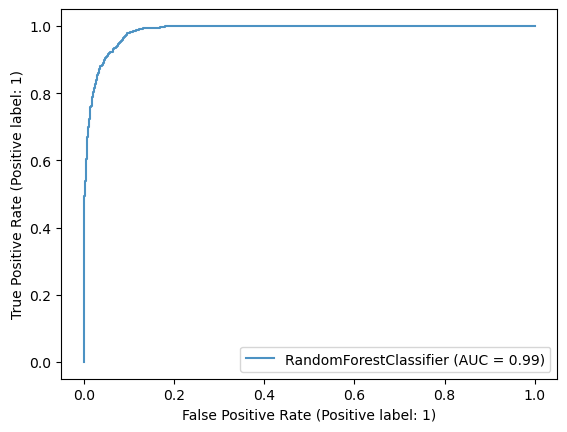

In [42]:
# Plot the RoC Curve
from sklearn.model_selection import train_test_split
from sklearn.metrics import RocCurveDisplay
rf_classifier = RandomForestClassifier(class_weight='balanced', max_depth=8,
                       min_samples_leaf=30, min_samples_split=50,
                       n_estimators=400)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
rf_classifier.fit(X_train,y_train)
ax = plt.gca()
rfc_disp = RocCurveDisplay.from_estimator(rf_classifier, X_test, y_test, ax=ax, alpha=0.8)

### Classification using SVM Classifier

In [23]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score

In [24]:
clf = SVC(class_weight='balanced')
param_grid = [{'kernel':['rbf','polynomial'],'gamma':[0.1,0.01,0.001],'C':[0.1,1,10],'degree':[2,3,4] }]
gsv = GridSearchCV(clf,param_grid,cv=5,scoring="roc_auc",verbose=5)
gsv.fit(X,y)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END C=0.1, degree=2, gamma=0.1, kernel=rbf;, score=0.576 total time=  13.0s
[CV 2/5] END C=0.1, degree=2, gamma=0.1, kernel=rbf;, score=0.634 total time=  12.6s
[CV 3/5] END C=0.1, degree=2, gamma=0.1, kernel=rbf;, score=0.738 total time=  12.5s
[CV 4/5] END C=0.1, degree=2, gamma=0.1, kernel=rbf;, score=0.707 total time=  13.1s
[CV 5/5] END C=0.1, degree=2, gamma=0.1, kernel=rbf;, score=0.673 total time=  19.1s
[CV 1/5] END C=0.1, degree=2, gamma=0.1, kernel=polynomial;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, degree=2, gamma=0.1, kernel=polynomial;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, degree=2, gamma=0.1, kernel=polynomial;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, degree=2, gamma=0.1, kernel=polynomial;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, degree=2, gamma=0.1, kernel=polynomial;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, degree=2, gamma=0.01, kernel=rbf;, score=0.

[CV 3/5] END C=1, degree=2, gamma=0.1, kernel=rbf;, score=0.740 total time=  18.0s
[CV 4/5] END C=1, degree=2, gamma=0.1, kernel=rbf;, score=0.708 total time=  15.9s
[CV 5/5] END C=1, degree=2, gamma=0.1, kernel=rbf;, score=0.675 total time=  45.9s
[CV 1/5] END C=1, degree=2, gamma=0.1, kernel=polynomial;, score=nan total time=   0.0s
[CV 2/5] END C=1, degree=2, gamma=0.1, kernel=polynomial;, score=nan total time=   0.0s
[CV 3/5] END C=1, degree=2, gamma=0.1, kernel=polynomial;, score=nan total time=   0.0s
[CV 4/5] END C=1, degree=2, gamma=0.1, kernel=polynomial;, score=nan total time=   0.0s
[CV 5/5] END C=1, degree=2, gamma=0.1, kernel=polynomial;, score=nan total time=   0.0s
[CV 1/5] END C=1, degree=2, gamma=0.01, kernel=rbf;, score=0.577 total time=  31.3s
[CV 2/5] END C=1, degree=2, gamma=0.01, kernel=rbf;, score=0.635 total time=  21.7s
[CV 3/5] END C=1, degree=2, gamma=0.01, kernel=rbf;, score=0.740 total time=  19.6s
[CV 4/5] END C=1, degree=2, gamma=0.01, kernel=rbf;, score=

[CV 1/5] END C=10, degree=2, gamma=0.01, kernel=rbf;, score=0.577 total time=  32.1s
[CV 2/5] END C=10, degree=2, gamma=0.01, kernel=rbf;, score=0.635 total time=  35.1s
[CV 3/5] END C=10, degree=2, gamma=0.01, kernel=rbf;, score=0.741 total time=  16.0s
[CV 4/5] END C=10, degree=2, gamma=0.01, kernel=rbf;, score=0.708 total time=  28.8s
[CV 5/5] END C=10, degree=2, gamma=0.01, kernel=rbf;, score=0.675 total time=  29.9s
[CV 1/5] END C=10, degree=2, gamma=0.01, kernel=polynomial;, score=nan total time=   0.0s
[CV 2/5] END C=10, degree=2, gamma=0.01, kernel=polynomial;, score=nan total time=   0.0s
[CV 3/5] END C=10, degree=2, gamma=0.01, kernel=polynomial;, score=nan total time=   0.0s
[CV 4/5] END C=10, degree=2, gamma=0.01, kernel=polynomial;, score=nan total time=   0.0s
[CV 5/5] END C=10, degree=2, gamma=0.01, kernel=polynomial;, score=nan total time=   0.0s
[CV 1/5] END C=10, degree=2, gamma=0.001, kernel=rbf;, score=0.577 total time=  33.7s
[CV 2/5] END C=10, degree=2, gamma=0.00

C:\Users\shiva\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
135 fits failed out of a total of 270.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
135 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\shiva\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\shiva\anaconda3\Lib\site-packages\sklearn\svm\_base.py", line 180, in fit
    self._validate_params()
  File "C:\Users\shiva\anaconda3\Lib\site-packages\sklearn\base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\shiva\anaconda3\Lib\site-packages\sk

GridSearchCV(cv=5, estimator=SVC(class_weight='balanced'),
             param_grid=[{'C': [0.1, 1, 10], 'degree': [2, 3, 4],
                          'gamma': [0.1, 0.01, 0.001],
                          'kernel': ['rbf', 'polynomial']}],
             scoring='roc_auc', verbose=5)

In [27]:
gsv.best_estimator_

SVC(C=10, class_weight='balanced', degree=2, gamma=0.1)

In [26]:
gsv.best_score_

0.6690144324821723

In [28]:
# Build the model with best combination of parameters
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_predict, KFold
svm_classifier = SVC(kernel ='rbf', C = 10, gamma=0.1, degree=2)
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
predictions = cross_val_predict(svm_classifier, X, y, cv=kf)
classification_rep = classification_report(y, predictions)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.98      0.35      0.51      6599
           1       0.60      0.99      0.75      6599

    accuracy                           0.67     13198
   macro avg       0.79      0.67      0.63     13198
weighted avg       0.79      0.67      0.63     13198



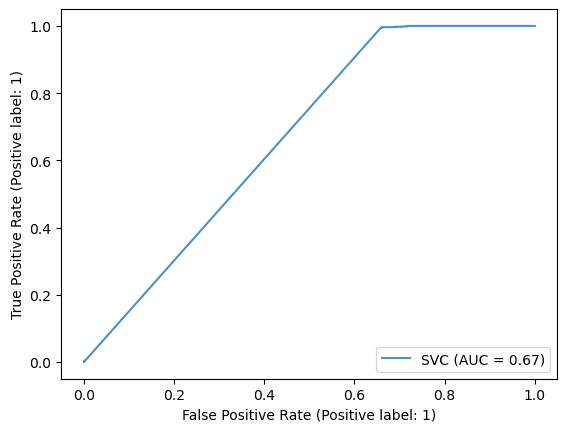

In [30]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import RocCurveDisplay
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
# Plot the RoC Curve
svm_classifier = SVC(kernel ='rbf',gamma = 0.1, C = 10,degree=2)
svm_classifier.fit(X_train,y_train)
ax = plt.gca()
svc_disp = RocCurveDisplay.from_estimator(svm_classifier, X_test, y_test, ax=ax, alpha=0.8)

### Classification using XGBOOST Classifier

In [32]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score

In [16]:
xgbc = XGBClassifier()
param_grid = [{'n_estimators':[100,200,300],'max_depth':[6,8,10]}]
CV = 10
gsv_xgb = GridSearchCV(xgbc,param_grid=param_grid,cv=CV, verbose =2, scoring='roc_auc' )
gsv_xgb.fit(X,y)               

Fitting 10 folds for each of 9 candidates, totalling 90 fits
[CV] END ......................max_depth=6, n_estimators=100; total time=   2.1s
[CV] END ......................max_depth=6, n_estimators=100; total time=   2.2s
[CV] END ......................max_depth=6, n_estimators=100; total time=   2.1s
[CV] END ......................max_depth=6, n_estimators=100; total time=   2.1s
[CV] END ......................max_depth=6, n_estimators=100; total time=   2.2s
[CV] END ......................max_depth=6, n_estimators=100; total time=   2.1s
[CV] END ......................max_depth=6, n_estimators=100; total time=   2.9s
[CV] END ......................max_depth=6, n_estimators=100; total time=   3.0s
[CV] END ......................max_depth=6, n_estimators=100; total time=   3.1s
[CV] END ......................max_depth=6, n_estimators=100; total time=   3.1s
[CV] END ......................max_depth=6, n_estimators=200; total time=   4.8s
[CV] END ......................max_depth=6, n_es

GridSearchCV(cv=10,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None..._bin=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             param_grid=[{'max_depth': [6, 8, 10],
                          'n_estimators': [100, 200, 300]}],
             scoring='roc_auc', verbose=2)

In [18]:
gsv_xgb.best_estimator_

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=300, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [17]:
gsv_xgb.best_score_

0.9988749259737671

In [33]:
# Build the model with best combination of parameters

xgbc_classifier = XGBClassifier(max_depth = 6, n_estimators =300)
num_folds = 10
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
predictions = cross_val_predict(xgbc_classifier, X, y, cv=kf )
classification_rep = classification_report(y, predictions)
print(classification_rep)

              precision    recall  f1-score   support

           0       1.00      0.98      0.99      6599
           1       0.98      1.00      0.99      6599

    accuracy                           0.99     13198
   macro avg       0.99      0.99      0.99     13198
weighted avg       0.99      0.99      0.99     13198



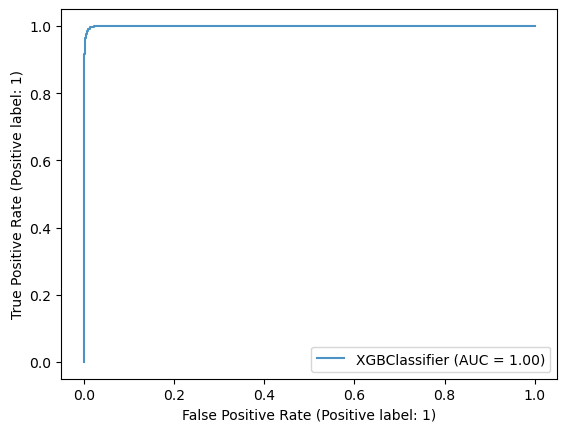

In [34]:
# Plot the RoC Curve
from sklearn.metrics import RocCurveDisplay
xgbc_classifier.fit(X_train,y_train)
ax = plt.gca()
xgbc_disp = RocCurveDisplay.from_estimator(xgbc_classifier, X_test, y_test, ax=ax, alpha=0.8)

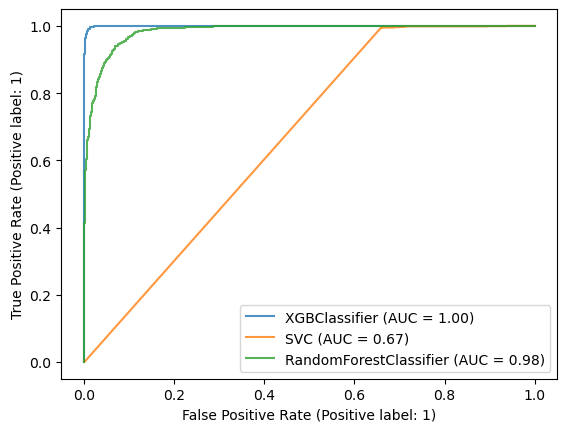

In [38]:
# RoC curves combined graph
ax = plt.gca()
xgbc_disp = RocCurveDisplay.from_estimator(xgbc_classifier, X_test, y_test, ax=ax, alpha=0.8)
svc_disp = RocCurveDisplay.from_estimator(svm_classifier, X_test, y_test, ax=ax, alpha=0.8)
rfc_disp = RocCurveDisplay.from_estimator(rf_classifier, X_test, y_test, ax=ax, alpha=0.8)
